# Spatial Pathway Analysis Tutorial
In this tutorial we:

- process a metaspace dataset for Spatial Pathway Analysis (SPA)
- Run SPA using kernel PCA
- Cluster the dataset using the pathway scores and investigate the clusters

The ICL A30 Adenocarcinoma metaspace dataset (https://metaspace2020.org/dataset/2016-10-01_12h10m16s) is used in this tutorial


In [27]:
#import modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sspa
from metaspace import SMInstance
from scipy.cluster.hierarchy import linkage, fcluster, dendrogram
from scipy.stats import zscore
import src.spca.__init__ as spca

## Loading dataset

In [2]:
# load dataset 
sm = SMInstance()
colorectal_ad_dsid = "2016-10-01_12h10m16s"
ds = sm.dataset(id=colorectal_ad_dsid)
results = ds.results(database=("ChEBI", "2016"))

- here we filter the metaspace dataset annotations by False Discovery Rate (FDR). 

In [3]:
# Filter results by FDR 
results_filt = results[results["fdr"]<= 0.2]
# create mol_formula column to filter pixel intensities by presence of chebi matches
results_filt["mol_formula"] = results_filt.index.map(lambda x: f"{x[0]}{x[1][1:]}")

results_filt

/var/folders/r_/3f54jbw50qxfg21m_gk0c9xh0000gn/T/ipykernel_259/3909118596.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results_filt["mol_formula"] = results_filt.index.map(lambda x: f"{x[0]}{x[1][1:]}")


,,ionFormula,ion,mz,msm,rhoSpatial,rhoSpectral,moc,fdr,offSample,isotopeImages,colocCoeff,moleculeNames,moleculeIds,intensity,mol_formula
formula,adduct,,,,,,,,,,,,,,,
C18H34O2,-H,C18H33O2,C18H34O2-H-,281.248604,0.984025,0.987732,0.997546,0.998699,0.05,False,"[{'mz': 281.2485253910554, 'url': 'https://s3....",None,"[ethyl palmitoleate, vaccenic acid, oleic acid...","[CHEBI:84934, CHEBI:36023, CHEBI:16196, CHEBI:...",45720.996094,C18H34O2H
C16H32O2,-H,C16H31O2,C16H32O2-H-,255.232954,0.981322,0.984713,0.997486,0.999068,0.05,False,"[{'mz': 255.23287532705822, 'url': 'https://s3...",None,"[4,8,12-trimethyltridecanoic acid, 14-methylpe...","[CHEBI:58966, CHEBI:84890, CHEBI:15756, CHEBI:...",22740.777344,C16H32O2H
C42H80NO10P,-H,C42H79NO10P,C42H80NO10P-H-,788.544708,0.972404,0.980547,0.993484,0.998201,0.05,False,"[{'mz': 788.5446293230552, 'url': 'https://s3....",None,[1-oleoyl-2-stearoyl-sn-glycero-3-phospho-L-se...,"[CHEBI:75103, CHEBI:79096]",4272.436035,C42H80NO10PH
C18H36O2,-H,C18H35O2,C18H36O2-H-,283.264254,0.970332,0.974088,0.997077,0.999064,0.05,False,"[{'mz': 283.26417545505535, 'url': 'https://s3...",None,"[ethyl hexadecanoate, 16-methylheptadecanoic a...","[CHEBI:84932, CHEBI:84896, CHEBI:85218, CHEBI:...",15875.057617,C18H36O2H
C48H83NO10P,-H,C48H82NO10P,C48H83NO10P-H-,863.568183,0.965107,0.980849,0.987304,0.996603,0.05,False,"[{'mz': 863.5681044190555, 'url': 'https://s3....",None,[phosphatidylserine 42:5(1-)],[CHEBI:72090],2977.485352,C48H83NO10PH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C13H30BrN,-H,C13H29NBr,C13H30BrN-H-,278.148887,0.005866,0.008446,0.705181,0.984891,0.20,False,"[{'mz': 278.14880793305537, 'url': 'https://s3...",None,[decyltrimethylammonium bromide],[CHEBI:295756],76.570778,C13H30BrNH
C27H43O4,-H,C27H42O4,C27H43O4-H-,430.308858,0.005862,0.007180,0.876228,0.931818,0.20,False,"[{'mz': 430.30877991905544, 'url': 'https://s3...",None,"[(25R)-3beta,4beta-dihydroxycholest-5-en-26-oa...",[CHEBI:86116],99.551361,C27H43O4H
C15H28O,-H,C15H27O,C15H28O-H-,223.206739,0.005819,0.006137,0.953337,0.994710,0.20,True,"[{'mz': 223.20666057905817, 'url': 'https://s3...",None,[trans-13-methyltetradec-2-enal],[CHEBI:70995],49.793556,C15H28OH


## Download image sets

- Download the pixel intensities using the Metaspace API
- we process the pixel intensities to make a dataframe which can be segmented and which contains the ChEBI ids associated with each annotation

In [4]:
# saving pixel intensities 
isotope_image_sets = ds.all_annotation_images(fdr=0.2, only_first_isotope=True, scale_intensity=False)

100%|████████████████████████████████████████| 670/670 [00:02<00:00, 230.19it/s]


In [5]:
# process image set
pixel_intensities = spca.process_image_set(isotope_image_sets, results_filt)


In [6]:
print("average number of chebis per annotation:",results_filt["moleculeIds"].apply(len).mean())

average number of chebis per annotation: 3.5324324324324325


In [7]:
# with ChEBI annotations, remove "CHEBI:" prefix (not necessary if HMDB -> ChEBI id conversion has been done)
pixel_intensities["chebi"] = pixel_intensities["chebi"].apply(
    lambda lst: [s[6:] for s in lst] if isinstance(lst, list) else lst
)
pixel_intensities

,chebi,y0_x0,y0_x1,y0_x2,y0_x3,y0_x4,y0_x5,y0_x6,y0_x7,y0_x8,...,y93_x84,y93_x85,y93_x86,y93_x87,y93_x88,y93_x89,y93_x90,y93_x91,y93_x92,y93_x93
mol_formula,,,,,,,,,,,,,,,,,,,,,
C18H34O2H,"[84934, 36023, 16196, 50572, 28194, 29735, 360...",0.000000,0.000000,0.000000,0.000000,0.003922,0.003922,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C16H32O2H,"[58966, 84890, 15756, 50626, 84849]",0.062745,0.078431,0.070588,0.086275,0.086275,0.094118,0.082353,0.086275,0.086275,...,0.011765,0.011765,0.015686,0.015686,0.011765,0.015686,0.011765,0.011765,0.011765,0.011765
C42H80NO10PH,"[75103, 79096]",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.003922,0.000000,0.000000,0.003922,0.000000,0.000000,0.000000,0.000000,0.000000
C18H36O2H,"[84932, 84896, 85218, 28842, 65084]",0.109804,0.121569,0.113725,0.149020,0.149020,0.168627,0.145098,0.125490,0.137255,...,0.011765,0.019608,0.023529,0.015686,0.019608,0.019608,0.015686,0.019608,0.019608,0.019608
C20H32O2H,"[1182, 71488, 2451, 67830, 36039, 36306, 36302...",0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C14H28OH,"[84067, 78633]",0.000000,0.466667,0.000000,0.000000,0.000000,0.607843,0.505882,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C17H20O5H,"[2850, 85673, 69337, 2723, 6478, 70350, 67426,...",0.737255,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
C27H43O4H,[86116],0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


- We create a dictionary with molecular formulas as the keys and its associated ChEBIs as the values. This allows mapping the features to pathways using the ChEBI ids. 

In [8]:
# one-to-many pathway mapping 
# creating dict with formula:all chebis
formula_chebis = dict(zip(pixel_intensities.index, pixel_intensities['chebi']))
# drop keys with na values
formula_chebis = {k: v for k, v in formula_chebis.items() if v not in [np.nan, 'nan']}

## DBScan segmentation
- Here we segment the dataset to only include "on-sample" pixels.
- We segment on the summed FDR-filtered features using DBScan, However alternative inputs can be used such as Principal components (PCs), log ratios of PC loadings e.g. Log(top _n_ PC1 loadings / bottom _n_ PC1 loadings) so long as they are numpy arrays of shape (x,y)
- After DBSCan, we fix some spots and use the clustering mask to discard non-sample pixels

In [9]:
# summing all on-sample intensities together and visualizing
pixel_intensities_test = pixel_intensities.iloc[:, 1:]
pixel_intensities_test = pixel_intensities_test.T
pixel_intensities_test["sum"] = pixel_intensities_test.sum(axis = 1)
filt_tic = pixel_intensities_test["sum"]
# convert flattened pixel positions into 2d matrix
tic_matrix = spca.img_conversion(filt_tic)


Text(0.5, 1.0, 'Filtered TIC')

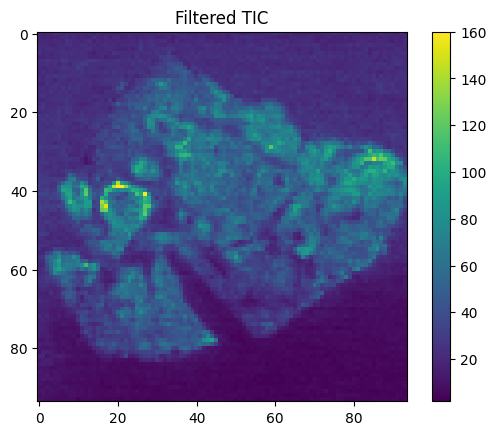

In [10]:
# visualize
plt.imshow(
    tic_matrix,
    cmap='viridis',
    # interpolation='nearest'
)
plt.colorbar(orientation = "vertical")
plt.title("Filtered TIC")


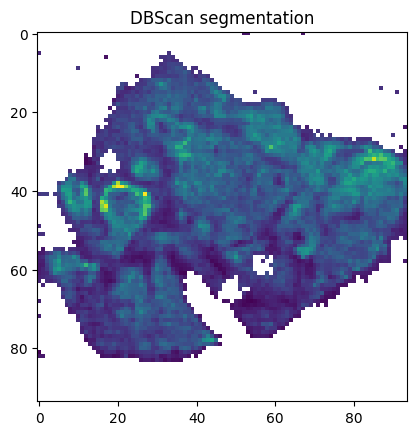

In [31]:
tic_np = tic_matrix.fillna(0).to_numpy()
segmented_array = spca.DBScan_array(tic_np, 0.033, 20)

In [12]:
# convert the matrix into a map
tissue_map = np.where(~np.isnan(segmented_array), 1, np.nan)
tissue_map

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

### Spot Cleaning
- cleaning up spots missed by DBScan

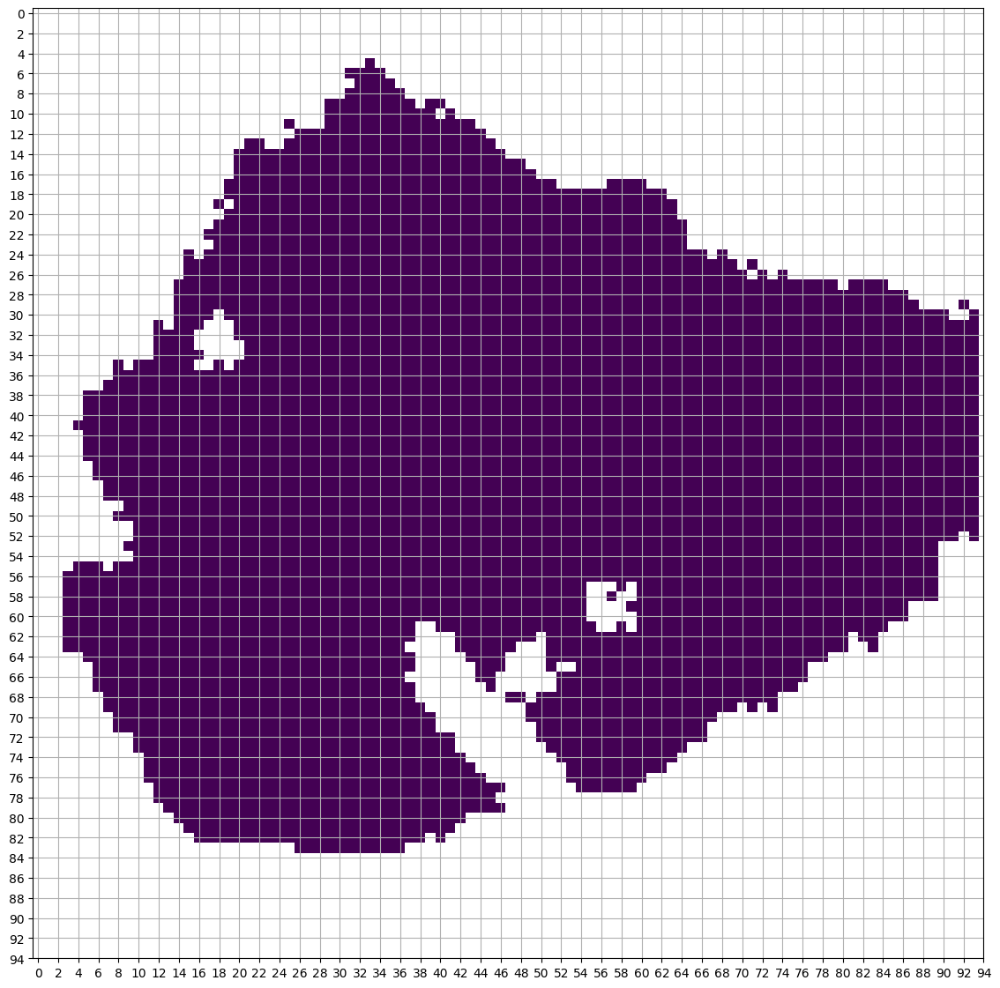

In [13]:
# clean up spots

off_sample_spots = [[0,53],[0,52], [0,67],
                    [5,0],
                    [6,17],
                    [9,10],
                    [14,87],
                    [15,55], [15,91],
                    [24,93], 
                    [26,90],
                    [41,0], [41,1], [41,2],
                    [49,0],
                    [51,0],[51,1],
                    [55,1],
                    [56,0],[56,1],[56,2],
                    [57,0],[57,1],[57,2],
                    [58,0],[58,1],[58,2],[58,93],
                    [59,0],[59,1],[59,2],
                    [60,0],[60,1],[60,2],
                    [61,0],[61,1],[61,2],
                    [62,0],[62,1],[62,2],
                    [63,0],[63,1],[63,2],
                    [64,1],
                    [68,0],
                    [72,0],
                    [81,0],
                    [82,0],[82,1]]

for spot in off_sample_spots:
    tissue_map[spot[0],spot[1]] = np.nan

plt.figure(figsize=(14,14))
plt.imshow(tissue_map, )
plt.yticks(range(0,96,2))
plt.xticks(range(0,96,2))
plt.grid()

### Tissue mask processing

In [14]:
# convert map into df to drop all non_sample pixels.
coord = []
value = []
for y, row in enumerate(tissue_map):
    for x, val in enumerate(row):
        string = f"y{y}_x{x}"
        coord.append(string)
        value.append(val)


mask_df = pd.DataFrame(value, index=coord, columns=["Mask"])

### SPCA processing
- After getting a tissue mask to identify "On-Sample" pixels, we can complete the processing of the pixel intensities for running spatial pathway analysis.
- The final processing includes dropping ChEBI ids from the pixel intensities dataframe, log normalization, and dropping non-sample pixels.

In [16]:
spca_pixel_intensities = spca.SPCA_processing(pixel_intensities, mask_df)

## Loading reactome
- We load the metabolite pathway information from Reactome using the ssPA module (Wieder, C., Lai, R.P.J. & Ebbels, T.M.D. Single sample pathway analysis in metabolomics: performance evaluation and application. BMC Bioinformatics 23, 481 (2022). https://doi.org/10.1186/s12859-022-05005-1)

In [17]:
# getting latest human reactome 
reactome_human_latest = sspa.process_reactome("Homo sapiens", download_latest=True, filepath = "./Reactomes", omics_type="metabolomics")
reactome_human_latest

Beginning Reactome download...
Reactome DB file saved to ./Reactomes/Reactome_Homo_sapiens_pathways_ChEBI_R93.gmt
Complete!


,Pathway_name,0,1,2,3,4,5,6,7,8,...,1621,1622,1623,1624,1625,1626,1627,1628,1629,1630
R-HSA-1059683,Interleukin-6 signaling,30616,456216,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
R-HSA-109581,Apoptosis,61120,4705,456216,28494,36080,15377,29105,43474,94128,...,None,None,None,None,None,None,None,None,None,None
R-HSA-109582,Hemostasis,15366,91144,15377,15378,15379,456215,456216,172573,48669,...,None,None,None,None,None,None,None,None,None,None
R-HSA-109606,Intrinsic Pathway for Apoptosis,456216,28494,36080,15377,43474,94128,47575,30616,133021,...,None,None,None,None,None,None,None,None,None,None
R-HSA-109703,PKB-mediated events,456216,57836,15377,58165,456215,30616,None,None,None,...,None,None,None,None,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
R-HSA-9953078,MPS II - Hunter syndrome (CS/DS degradation),15377,29108,63517,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
R-HSA-9953080,MPS VII - Sly syndrome (CS/DS degradation),15377,63505,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
R-HSA-9953097,MPS IX - Natowicz syndrome (CS/DS degradation),15377,63511,63512,63513,63515,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
R-HSA-9953111,MPS IV - Morquio syndrome B (CS/DS degradation),15377,63503,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


### Filtering Reactome
- in order to filter the pathways, we build a Directed Acyclic Graph and select only pathways at a distance of 2 or 3 from the roots (larger pathways such as "disease"). 
- Filtering using the DAG is not perfect but allows for easy removal of less useful pathways for analysis and interpretation and removes some pathway redundancy.


In [19]:
# build reactome DAG and extract pathways at n from roots or leaves
dag = spca.build_reactome_dag("HSA")
roots2_pathways = spca.get_pathways_at_level(dag, 2, from_roots=True)
roots3_pathways = spca.get_pathways_at_level(dag, 3, from_roots=True)
roots23_pathways = roots2_pathways.union(roots3_pathways)

In [21]:
# filter reactome based on distance from root
reactome_filtered = reactome_human_latest[reactome_human_latest.index.isin(roots23_pathways)]
# extract pathways with most ChEBI participants
prevalent = spca.drop_prevalent(reactome_filtered, 1)
print(prevalent)
reactome_filtered = reactome_filtered[~reactome_filtered["Pathway_name"].isin(prevalent)]
# drop unnecessary columns
reactome_filtered = reactome_filtered.dropna(axis=1, how='all')
reactome_human_latest = reactome_filtered

R-HSA-500792    GPCR ligand binding
Name: Pathway_name, dtype: object


/Users/kuuttivaananen/Desktop/Ebbels/github/src/spca/reactome_filt.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reactome_df["NaN_Count"] = reactome_df.isna().sum(axis=1)


## Running SPCA:
- Here we run Spatial Pathway analysis using rbf kernel Principal Component Analysis (kPCA). 
- For each pathway, we map features to them using the ChEBI ids. If more than 2 features are mapped to a pathway, the mapped features undergo dimensionality reduction by kPCA to produce a pathway score for each pixel. 
- Note, the pathway scores are not representative of pathway activities


In [22]:
spa = spca.spa_KPCA(reactome_human_latest, formula_chebis, 2)
spa_res_df = spa.fit_transform(spca_pixel_intensities)


pathway Neurotransmitter receptors and postsynaptic signal transmission SSPA complete with 2 metabs
pathway Bile acid and bile salt metabolism SSPA complete with 7 metabs
pathway PPARA activates gene expression SSPA complete with 2 metabs
pathway Cytochrome P450 - arranged by substrate type SSPA complete with 7 metabs
pathway Phase I - Functionalization of compounds SSPA complete with 7 metabs
pathway Arachidonate metabolism SSPA complete with 5 metabs
pathway Class A/1 (Rhodopsin-like receptors) SSPA complete with 12 metabs
pathway Transcriptional regulation of white adipocyte differentiation SSPA complete with 2 metabs
pathway Synthesis, secretion, and inactivation of Glucagon-like Peptide-1 (GLP-1) SSPA complete with 4 metabs
pathway GPCR downstream signalling SSPA complete with 9 metabs
pathway Prostacyclin signalling through prostacyclin receptor SSPA complete with 2 metabs
pathway Regulation of lipid metabolism by PPARalpha SSPA complete with 3 metabs
pathway Incretin synthesis, 

### Clustering

- following SPA, we cluster both the pathway scores in order to investigate the Tumour in the sample.

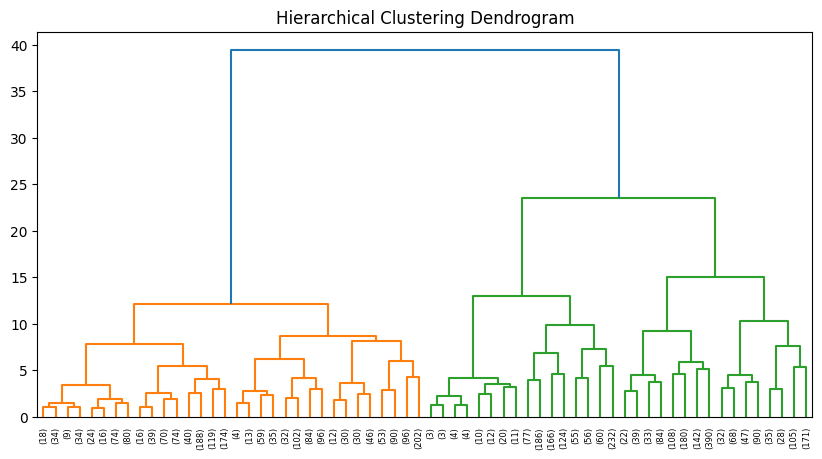

In [24]:
# Compute hierarchical clustering
num_clusters = 2
Z = linkage(spa_res_df, method='ward')

# Z = linkage(sspa_res_df, method='ward')
hac_sspa = fcluster(Z, t=num_clusters, criterion='maxclust')  # 4 clusters

# Plot dendrogram
plt.figure(figsize=(10, 5))
dendrogram(Z, truncate_mode="level", p=5)
plt.title("Hierarchical Clustering Dendrogram")
plt.show()

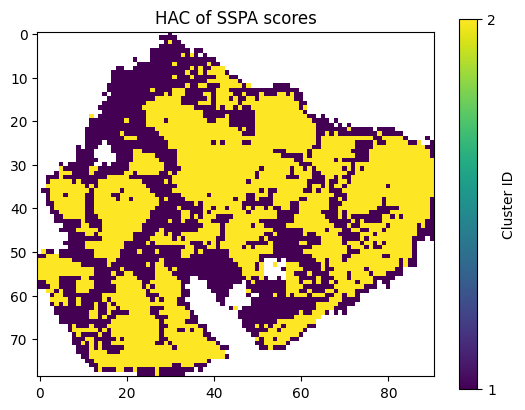

In [25]:
# map clusters back onto Spatial coords
col = {"Cluster":hac_sspa}
dim_HAC_df = pd.DataFrame(col, index = spa_res_df.index)
selected_matrix = spca.img_conversion(dim_HAC_df)

plt.imshow(selected_matrix.values, origin="upper")  # Use categorical colormap
plt.title("HAC of SSPA scores")
# Add colorbar with labels
cbar = plt.colorbar(orientation ="vertical")
cbar.set_label("Cluster ID")
cbar.set_ticks(range(1,num_clusters+1))  # Set colorbar ticks to match cluster numbers
cbar.set_ticklabels(range(1,num_clusters+1))

### Interpreting clusters
- We can then analyze the clusters in-terms of over-expressed pathway scores.
- This can allow for interpretation of pathway differences in a diseased state or pathway difference in biological structures
- Below we calculate the Z-score for the pathways between the 2 clusters 


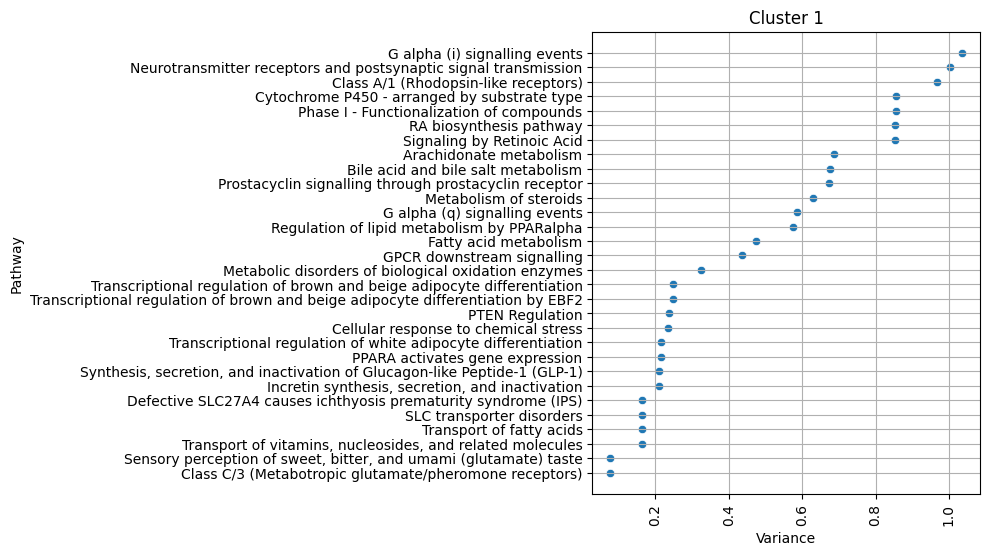

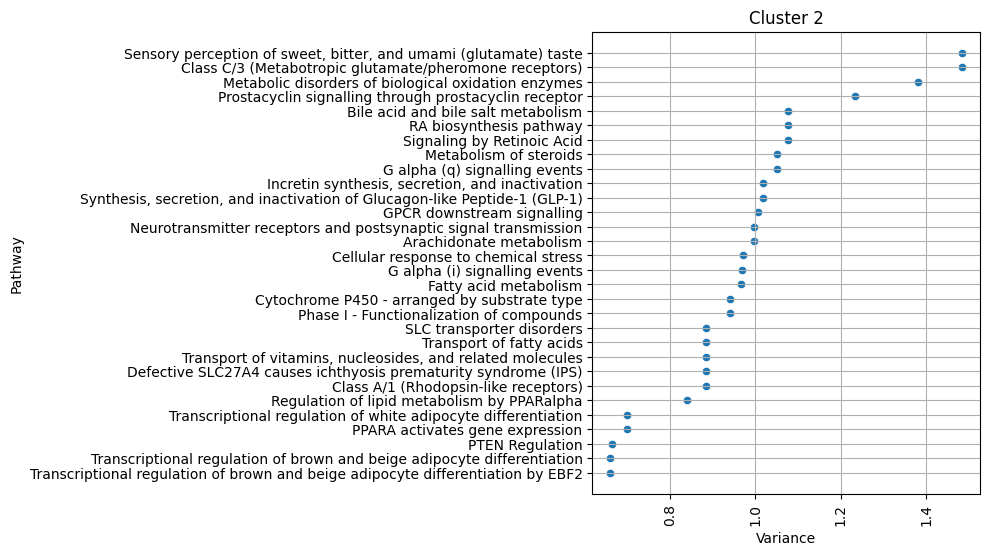

In [28]:
# calculate z-score for PCA clusters for pathways
# reset dim_HAC_df index as it was converted to multi-index in img_conversion
dim_HAC_df = pd.DataFrame(col, index = spa_res_df.index)
spa_scores_pcaclust = spa_res_df
spa_scores_pcaclust["clust_dif"] = dim_HAC_df
# run calculation
# Extract expression level columns
expression_cols = spa_scores_pcaclust.columns.difference(['clust_dif'])

# Compute Z-scores for all expression levels
df_z = spa_scores_pcaclust[expression_cols].apply(zscore)

# Add Cluster column back
df_z['clust_dif'] = spa_scores_pcaclust['clust_dif']

# Compute variance within each cluster for each gene
var_by_cluster = df_z.groupby('clust_dif').var()
# visualize the z-score for each cluster
# Reset index to get cluster as a column
var_by_cluster = var_by_cluster.reset_index()

# Melt dataframe for better plotting (long format)
var_long = var_by_cluster.melt(id_vars="clust_dif", var_name="Pathway", value_name="Variance")
# Get unique clusters
uni_clusters = var_long["clust_dif"].unique()

# Loop through each cluster and create separate plots
for uni in uni_clusters:
    # Create a new figure for each cluster
    plt.figure(figsize=(5, 6))
    
    # Filter data for the current cluster and sort by variance
    cluster_data = var_long[var_long["clust_dif"] == uni].sort_values(by="Variance", ascending=False)
    
    # Scatter plot with sorted genes
    sns.scatterplot(data=cluster_data, y="Pathway", x="Variance")
    
    # Improve readability
    plt.title(f"Cluster {uni}")
    plt.xlabel("Variance")
    plt.xticks(rotation=90)  # Rotate labels for visibility
    plt.grid()
    plt.tight_layout
    # Show each plot separately
    plt.show()